In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import sklearn
import glob
import os
import datetime as dt
import matplotlib.pyplot as plt # Visualization
import seaborn as sns #Visualization
import category_encoders as ce



In [28]:


path = os.path.dirname(os.getcwd()) + '\\data\\'
print(f"CWD:{path}")
csv_files = glob.glob(os.path.join(path, "*.csv"))


# for f in csv_files:
#     filename = f.split('\\')[-1]
#     print(f"File detected:{filename}")
#     single_df = pd.read_csv(f)
    

df = pd.concat((pd.read_csv(f) for f in csv_files), ignore_index=True)
    

print('\nNumber of rows and columns in the data set: ',df.shape)
print('')

df.info()

#Lets look into top few rows and columns in the dataset
df.head()
display(df)


CWD:C:\Users\JasonTan\SIT\GitHub\1002_project\data\

Number of rows and columns in the data set:  (881884, 11)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 881884 entries, 0 to 881883
Data columns (total 11 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   month                881884 non-null  object 
 1   town                 881884 non-null  object 
 2   flat_type            881884 non-null  object 
 3   block                881884 non-null  object 
 4   street_name          881884 non-null  object 
 5   storey_range         881884 non-null  object 
 6   floor_area_sqm       881884 non-null  float64
 7   flat_model           881884 non-null  object 
 8   lease_commence_date  881884 non-null  int64  
 9   resale_price         881884 non-null  float64
 10  remaining_lease      172834 non-null  object 
dtypes: float64(2), int64(1), object(8)
memory usage: 74.0+ MB


,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,resale_price,remaining_lease
0,1990-01,ANG MO KIO,1 ROOM,309,ANG MO KIO AVE 1,10 TO 12,31.0,IMPROVED,1977,9000.0,NaN
1,1990-01,ANG MO KIO,1 ROOM,309,ANG MO KIO AVE 1,04 TO 06,31.0,IMPROVED,1977,6000.0,NaN
2,1990-01,ANG MO KIO,1 ROOM,309,ANG MO KIO AVE 1,10 TO 12,31.0,IMPROVED,1977,8000.0,NaN
3,1990-01,ANG MO KIO,1 ROOM,309,ANG MO KIO AVE 1,07 TO 09,31.0,IMPROVED,1977,6000.0,NaN
4,1990-01,ANG MO KIO,3 ROOM,216,ANG MO KIO AVE 1,04 TO 06,73.0,NEW GENERATION,1976,47200.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...
881879,2014-12,YISHUN,5 ROOM,816,YISHUN ST 81,10 TO 12,122.0,Improved,1988,580000.0,NaN
881880,2014-12,YISHUN,EXECUTIVE,325,YISHUN CTRL,10 TO 12,146.0,Maisonette,1988,540000.0,NaN
881881,2014-12,YISHUN,EXECUTIVE,618,YISHUN RING RD,07 TO 09,164.0,Apartment,1992,738000.0,NaN
881882,2014-12,YISHUN,EXECUTIVE,277,YISHUN ST 22,07 TO 09,152.0,Maisonette,1985,592000.0,NaN


In [29]:
# preview data

blacklisted_columns = ["street_name"]

for column in df:
    if column not in blacklisted_columns:
        print(f"\n\nUNIQUE VALUES: {column}\nVALUES:{len(df[column].unique())}")
        print(df[column].unique())





UNIQUE VALUES: month
VALUES:393
['1990-01' '1990-02' '1990-03' '1990-04' '1990-05' '1990-06' '1990-07'
 '1990-08' '1990-09' '1990-10' '1990-11' '1990-12' '1991-01' '1991-02'
 '1991-03' '1991-04' '1991-05' '1991-06' '1991-07' '1991-08' '1991-09'
 '1991-10' '1991-11' '1991-12' '1992-01' '1992-02' '1992-03' '1992-04'
 '1992-05' '1992-06' '1992-07' '1992-08' '1992-09' '1992-10' '1992-11'
 '1992-12' '1993-01' '1993-02' '1993-03' '1993-04' '1993-05' '1993-06'
 '1993-07' '1993-08' '1993-09' '1993-10' '1993-11' '1993-12' '1994-01'
 '1994-02' '1994-03' '1994-04' '1994-05' '1994-06' '1994-07' '1994-08'
 '1994-09' '1994-10' '1994-11' '1994-12' '1995-01' '1995-02' '1995-03'
 '1995-04' '1995-05' '1995-06' '1995-07' '1995-08' '1995-09' '1995-10'
 '1995-11' '1995-12' '1996-01' '1996-02' '1996-03' '1996-04' '1996-05'
 '1996-06' '1996-07' '1996-08' '1996-09' '1996-10' '1996-11' '1996-12'
 '1997-01' '1997-02' '1997-03' '1997-04' '1997-05' '1997-06' '1997-07'
 '1997-08' '1997-09' '1997-10' '1997-11' '1

In [30]:
e = df[df['month'] >= "2017-01"]

e.info()

# #Lets look into top few rows and columns in the dataset
e.head()
print(len(e))
# display(e)

# print(len(df[(df['month'] > "2022-09")]))


<class 'pandas.core.frame.DataFrame'>
Int64Index: 135681 entries, 694000 to 829680
Data columns (total 11 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   month                135681 non-null  object 
 1   town                 135681 non-null  object 
 2   flat_type            135681 non-null  object 
 3   block                135681 non-null  object 
 4   street_name          135681 non-null  object 
 5   storey_range         135681 non-null  object 
 6   floor_area_sqm       135681 non-null  float64
 7   flat_model           135681 non-null  object 
 8   lease_commence_date  135681 non-null  int64  
 9   resale_price         135681 non-null  float64
 10  remaining_lease      135681 non-null  object 
dtypes: float64(2), int64(1), object(8)
memory usage: 12.4+ MB
135681


In [31]:
# to standardise data
# KIV, current looping is  likely not the most efficient option

# flat type names set to be consistent 
df.loc[df['flat_type'] == "MULTI GENERATION", 'flat_type'] = "MULTI-GENERATION"
df['flat_model'] = df['flat_model'].str.upper()


# # calculate missing remaining_lease value for rows before 2017
# for index, row in df.loc[df['remaining_lease'].isna()].iterrows():
#     # take lease commence date + 99 years, then take the result year and deduct by current year
#     lease_end_year  = int(row["lease_commence_date"]) + 99
#     year_month_pair = row["month"].split("-")
#     current_year = int(year_month_pair[0]) + int(int(year_month_pair[1]) > 7)
#     lease_duration_left = lease_end_year - current_year
#     df.at[index,'remaining_lease'] = lease_duration_left

middle_floor_value = lambda min_floor_str, max_floor_str : int((int(max_floor_str) + int(min_floor_str)) / 2)

for index, row in df.iterrows():
    
    if "year" in str(row['remaining_lease']):
        # if remaining_lease contains words
        remaining_lease_text_list = row["remaining_lease"].split(" ") # split x years y months to ["x", "years", "y", "months"]
        lease_duration_left = int(remaining_lease_text_list[0])

        if len(remaining_lease_text_list) == 4 and "month" in remaining_lease_text_list[3]:  # if a month value is detected in the row
            if int(remaining_lease_text_list[2]) > 7:
                lease_duration_left += 1
        df.at[index,'remaining_lease'] = lease_duration_left
        
    elif pd.isnull(row['remaining_lease']):
        # take lease commence date + 99 years, then take the result year and deduct by current year
        lease_end_year  = int(row["lease_commence_date"]) + 99
        year_month_pair = row["month"].split("-")
        current_year = int(year_month_pair[0]) + int(int(year_month_pair[1]) > 7) # if the current date is 2nd half of the year,  we round the year number up by 1
        lease_duration_left = lease_end_year - current_year
        df.at[index,'remaining_lease'] = lease_duration_left
    
    if "TO" in row["storey_range"]:
        # convert storey_range from e.g. 3 TO 5 to e.g. 4
        storey_range_min_max = row["storey_range"].split("TO")
        mid_floor_value = middle_floor_value(storey_range_min_max[0], storey_range_min_max[1])
        df.at[index,'storey_range'] = mid_floor_value
        
    
# now that month has been used to calculate remaining lease, we convert the month into a format that the 
# regression model understands
df['month'] = pd.to_datetime(df['month'])
df['month'] = df['month'].map(dt.datetime.toordinal)

# set remaining_lease values for records 2017 or later, as they are in the format of x years +-(y months)
# for index, row in df.loc["year" in df['remaining_lease']].iterrows():
#     remaining_lease_text_list = row["remaining_lease"].split(" ") # split x years y months to ["x", "years", "y", "months"]
#     lease_duration_left = int(remaining_lease_text_list[0])
    
#     if len(remaining_lease_text_list) == 4 and "month" in remaining_lease_text_list[3]:  # if a month value is detected in the row
#         if int(remaining_lease_text_list[2]) > 7:
#             lease_duration_left += 1
#     df.at[index,'remaining_lease'] = lease_duration_left

for column in df:
    if column not in blacklisted_columns:
        print(f"\n\nUNIQUE VALUES: {column}\nVALUES:{len(df[column].unique())}")
        print(df[column].unique())




UNIQUE VALUES: month
VALUES:393
[726468 726499 726527 726558 726588 726619 726649 726680 726711 726741
 726772 726802 726833 726864 726892 726923 726953 726984 727014 727045
 727076 727106 727137 727167 727198 727229 727258 727289 727319 727350
 727380 727411 727442 727472 727503 727533 727564 727595 727623 727654
 727684 727715 727745 727776 727807 727837 727868 727898 727929 727960
 727988 728019 728049 728080 728110 728141 728172 728202 728233 728263
 728294 728325 728353 728384 728414 728445 728475 728506 728537 728567
 728598 728628 728659 728690 728719 728750 728780 728811 728841 728872
 728903 728933 728964 728994 729025 729056 729084 729115 729145 729176
 729206 729237 729268 729298 729329 729359 729390 729421 729449 729480
 729510 729541 729571 729602 729633 729663 729694 729724 729755 729786
 729814 729845 729875 729906 729936 729967 729998 730028 730059 730089
 730120 730151 730180 730211 730241 730272 730302 730333 730364 730394
 730425 730455 730486 730517 730545 730576 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 881884 entries, 0 to 881883
Data columns (total 11 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   month                881884 non-null  int64  
 1   town                 881884 non-null  object 
 2   flat_type            881884 non-null  object 
 3   block                881884 non-null  object 
 4   street_name          881884 non-null  object 
 5   storey_range         881884 non-null  int64  
 6   floor_area_sqm       881884 non-null  float64
 7   flat_model           881884 non-null  object 
 8   lease_commence_date  881884 non-null  int64  
 9   resale_price         881884 non-null  float64
 10  remaining_lease      881884 non-null  int64  
dtypes: float64(2), int64(4), object(5)
memory usage: 74.0+ MB


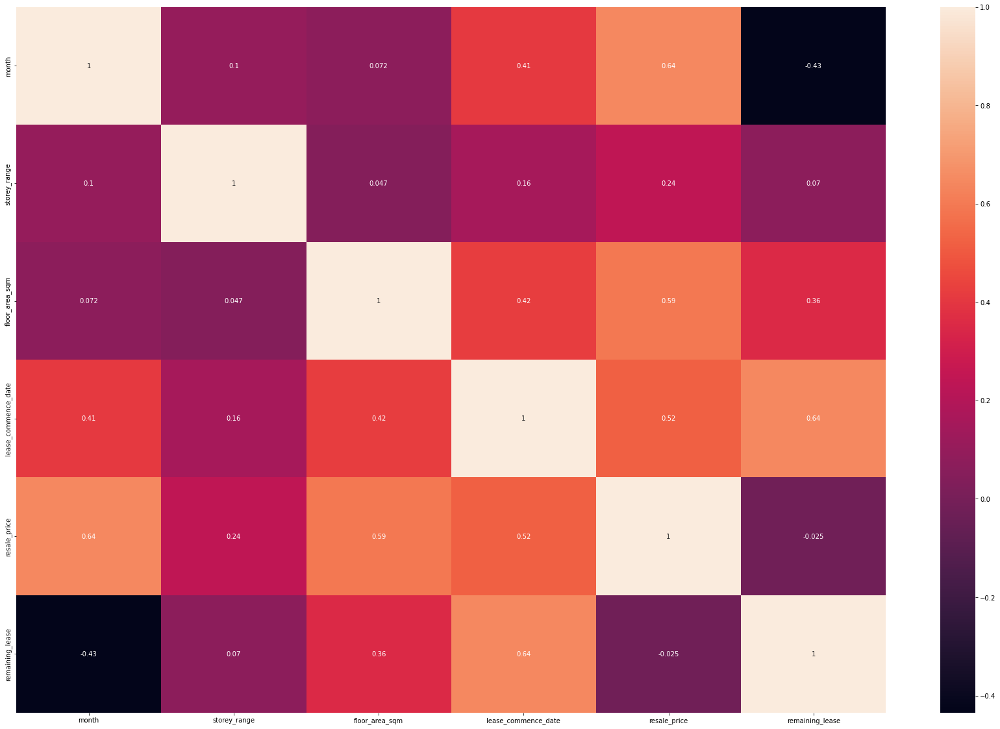

In [32]:
# data visualisation

df = df.astype({'remaining_lease': 'int64'})
df = df.astype({'storey_range': 'int64'})

# in a heatmap, the closer the value is to 1, the more positively correlated they are
# (if one value increases, so does the other)
fig,ax = plt.subplots(figsize=(30, 20))
sns.heatmap(df.corr(),annot=True,ax=ax)

df.info()

In [33]:
x = transformed_df.loc[:,'month']
y = transformed_df.loc[:,'resale_price']

min_resale_price = df['resale_price'].min()
max_resale_price = df['resale_price'].max()

print(min_resale_price, max_resale_price)
sns.set(rc={'figure.figsize':(14.7,10.27)})
sns.scatterplot(data=transformed_df, x="month", y="resale_price")

NameError: name 'transformed_df' is not defined

In [ ]:
# encode cetegorical data: town, flat type and flat model



# either binary or base-n, depending on how many extra columns you need to show categorical data
encode_columns = ['town', 'flat_type', 'flat_model']
data_encoder = ce.BinaryEncoder(cols=encode_columns) 

# ce_town = ce.BinaryEncoder(cols=['town']) 
# ce_flat_type = ce.BinaryEncoder(cols=['flat_type']) 
# ce_flat_model = ce.BinaryEncoder(cols=['flat_model']) 
# transformed_df = ce_town.fit_transform(df)
# transformed_df = ce_flat_type.fit_transform(transformed_df)
# transformed_df = ce_flat_model.fit_transform(transformed_df)

transformed_df = data_encoder.fit_transform(df)

df.head(5)


In [ ]:
# #standardise remaining_lease value
# for index, row in df.loc[df['remaining_lease'].isna()].iterrows():
#     # take lease commence date + 99 years, then take the result year and deduct by current year
    
#     current_year_month = row["month"].split("-")
#     print(current_year_month)
#     break
for column in transformed_df:
    if column not in blacklisted_columns:
        print(f"\n\nUNIQUE VALUES: {column}\nVALUES:{len(transformed_df[column].unique())}")
        print(transformed_df[column].unique())
transformed_df.info()
display(transformed_df[['month','block', 'street_name', 'storey_range', 'floor_area_sqm', 'lease_commence_date', 'resale_price', 'remaining_lease']])

In [ ]:
# the hail mary: removing a column
# removing street name and block, as the ML model will use the town column as the address category 
# maybe removing month? idk man

columns_to_remove = ['street_name', 'block']

for col in columns_to_remove:
    if col in transformed_df.columns:
        transformed_df = transformed_df.drop(col, axis=1)
    else:
        print(f"'{col}' column not found. skipping...")

In [ ]:
# todo list:

# see if you can convert block number ad street name to geolocation. if not, just take out the letter suffixes

# apply categorical data endocing to town, flat type and flat model. 
# not sure what to do with street name

In [ ]:
display(transformed_df)

In [ ]:

cols = list(transformed_df.columns.values) #Make a list of all of the columns in the df
cols.pop(cols.index('resale_price'))
transformed_df = transformed_df[cols+['resale_price']] #Create new dataframe with columns in the order you want


x = transformed_df.iloc[:,0:-1]  # contains all independent variables required for the model to derive the resale price
y = transformed_df.iloc[:,-1] # series object containing all resale price data

x.info()
display(x)


In [ ]:
y.info()
display(y)

In [ ]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test=train_test_split(x, y, test_size=0.3)

print(type(x_train))
print(type(x_test))
print(type(y_train))
print(type(y_test))

display(y_train)

from sklearn.linear_model import LinearRegression

naive_linear_reg = LinearRegression()
naive_linear_reg.fit(x_train,y_train)

predicted_result = naive_linear_reg.predict(x_test)

from sklearn.metrics import mean_squared_error, r2_score

print("MSE: ",np.sqrt(mean_squared_error(y_test,predicted_result)))
print("R2: ",r2_score(y_test,predicted_result))
print("RMSE: ",naive_linear_reg.score(x_test,y_test))

In [ ]:
from sklearn import preprocessing
#polynomial conversion + plain linear regression - ----- Most accurate

poly_features = preprocessing.PolynomialFeatures(degree=3)
x_poly = poly_features.fit_transform(x)

x_train,x_test,y_train,y_test = train_test_split(x_poly,y,test_size=0.4)

polynomial_regression = LinearRegression(fit_intercept=True, n_jobs=1, normalize=False)

polynomial_regression.fit(x_train,y_train) # fit sample values to sample answers

predicted_result = polynomial_regression.predict(x_test)
print("MSE: ",np.sqrt(mean_squared_error(y_test,predicted_result)))
print("R2: ",r2_score(y_test,predicted_result))
print("RMSE: ",polynomial_regression.score(x_test,y_test))

In [ ]:
display(predicted_result)

In [ ]:
display(x_poly)

In [ ]:
df.head(1)

In [ ]:
df.info()

In [ ]:
len(x_poly)

In [ ]:
# ce_town = ce.BinaryEncoder(cols=['town']) 
# ce_flat_type = ce.BinaryEncoder(cols=['flat_type']) 
# ce_flat_model = ce.BinaryEncoder(cols=['flat_model']) 
data_encoder_params = data_encoder.get_params()
print(data_encoder_params["cols"])
mapping_df = [m["mapping"] for m in data_encoder_params["mapping"] if m['col'] == "flat_model"][0]
print(type(mapping_df))
mapping_df.head(5)
#data_encoder.get_params()

In [ ]:
df['flat_model'].unique()

In [ ]:
dfx = transformed_df.drop_duplicates(subset=["flat_model_0", "flat_model_1", 
                                             "flat_model_2", "flat_model_3", 
                                             "flat_model_4"], keep="first")
display(dfx)

dfx2 = df.drop_duplicates(subset=["flat_model"], keep="first")
display(dfx2)

In [ ]:
print(ce_flat_model.get_params()["mapping"][0]["mapping"])

In [ ]:
# we have learnt that category encoders comes up with a unique value for every first occurrence of
# a unique label

# doing df.drop_duplicates(subset=["flat_model"], keep="first"), then getting the index list 
# and matching it with the index of ce_flat_model.get_params()["mapping"][0]["mapping"] should result 
# in a properly formed mapping table
unique_values = df['flat_model'].unique()
print(dfx2['flat_model'].tolist())
print(list(df['flat_model'].unique()))

print(len(df['flat_model'].unique()))
encoded_values = ce_flat_model.get_params()["mapping"][0]["mapping"]
output_dict = {}
counter = 0
for model in unique_values:
    output_dict[model] = encoded_values.iloc[counter].values.tolist()
    counter += 1
print(output_dict)
    

In [ ]:
test_data = [{
        "month" : "2019-05",
        "town": "ANG MO KIO",
        "flat_type": "5 ROOM",
        "block": "351",
        "street_name": "ANG MO KIO ST 32",
        "storey_range": "13 TO 15",
        "floor_area_sqm": "110",
        "flat_model": "MULTI GENERATION",
        "lease_commence_date": "2001",
        "remaining_lease": "81 years 04 months"
    }]

test_df = pd.DataFrame(test_data)
display(test_df)
value_to_change = test_df.iloc[0]["flat_model"]

print(value_to_change)

test_df.columns.get_loc('flat_model')

counter = 0
for encoder_column in output_dict[value_to_change]:
    test_df.insert(test_df.columns.get_loc('flat_model'), f'flat_model_{counter}', encoder_column)
    counter += 1

test_df = test_df.drop(columns=['flat_model'])
display(test_df)



In [ ]:
df.head()

In [26]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import plotly.graph_objects as go
import plotly.express as px
data_frame = pd.read_csv('out.csv')
data_frame['month'] = data_frame['month'].map(dt.datetime.fromordinal) #convert date to year-month-date format
flat_model_data = data_frame['flat_model']
new_df = flat_model_data.value_counts().rename_axis('flat_model').reset_index(name='number_of_flats_sold')
your_labels = new_df["flat_model"]
your_values = new_df["number_of_flats_sold"]

In [27]:
def flat_model():
    fig = px.pie(new_df,values= your_values,names = your_labels, title = "Flat models sold since 1990s")
    fig.update_traces(
                textposition='inside',
                textinfo='percent+label'
                )

    fig.update_layout(
                title_font_size = 30,
                )
    return fig

fig = flat_model()
print(new_df)
fig.show()

                flat_model  number_of_flats_sold
0                  MODEL A                247077
1                 IMPROVED                231159
2           NEW GENERATION                183738
3               SIMPLIFIED                 55892
4        PREMIUM APARTMENT                 42094
5                 STANDARD                 41450
6                APARTMENT                 34106
7               MAISONETTE                 28593
8                 MODEL A2                  9644
9                     DBSS                  2799
10      MODEL A-MAISONETTE                  2002
11           ADJOINED FLAT                  1181
12                 TERRACE                   675
13        MULTI GENERATION                   531
14                 TYPE S1                   379
15                 TYPE S2                   197
16     IMPROVED-MAISONETTE                   119
17  PREMIUM APARTMENT LOFT                    92
18      PREMIUM MAISONETTE                    86
19                  

In [4]:
data_frame.tail(30)

,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,resale_price,remaining_lease
881854,2014-12-01,YISHUN,4 ROOM,329,YISHUN RING RD,5,84.0,SIMPLIFIED,1988,310000.0,72
881855,2014-12-01,YISHUN,4 ROOM,366,YISHUN RING RD,8,108.0,MODEL A,1988,360000.0,72
881856,2014-12-01,YISHUN,4 ROOM,216,YISHUN ST 21,11,93.0,NEW GENERATION,1985,405000.0,69
881857,2014-12-01,YISHUN,4 ROOM,259,YISHUN ST 22,8,84.0,SIMPLIFIED,1986,325000.0,70
881858,2014-12-01,YISHUN,4 ROOM,260,YISHUN ST 22,5,84.0,SIMPLIFIED,1985,346000.0,69
881859,2014-12-01,YISHUN,4 ROOM,609,YISHUN ST 61,5,84.0,SIMPLIFIED,1986,330000.0,70
881860,2014-12-01,YISHUN,4 ROOM,637,YISHUN ST 61,11,85.0,SIMPLIFIED,1987,340000.0,71
881861,2014-12-01,YISHUN,4 ROOM,721,YISHUN ST 71,8,104.0,MODEL A,1985,365000.0,69
881862,2014-12-01,YISHUN,4 ROOM,876,YISHUN ST 81,2,88.0,SIMPLIFIED,1987,355000.0,71
881863,2014-12-01,YISHUN,4 ROOM,850,YISHUN ST 81,2,104.0,MODEL A,1988,375000.0,72


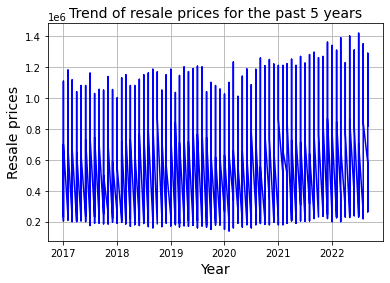

In [10]:

resale_price_data = data_frame['resale_price']
new_data_frame = data_frame[data_frame['month'] >= '2017-01-01']
x_axis = new_data_frame.loc[:,'month']
y_axis = new_data_frame.loc[:,'resale_price']
plt.plot(x_axis, y_axis, color='blue')
plt.title('Trend of resale prices for the past 5 years', fontsize=14)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Resale prices', fontsize=14)
plt.grid(True)
plt.show()

fig_trend = fig.add_trace(go.Scatter(x=x_axis, y=y_axis))
fig_trend = px.line(new_data_frame, x=x_axis, y=y_axis, title='Range Slider and Selectors')
fig_trend.update_layout(title_text="Trend of resale prices for the past 5 years with range slider and selectors")
fig_trend.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1m",
                     step="month",
                     stepmode="backward"),
                dict(count=6,
                     label="6m",
                     step="month",
                     stepmode="backward"),
                dict(count=1,
                     label="Year to latest date",
                     step="year",
                     stepmode="todate"),
                dict(count=1,
                     label="1y",
                     step="year",
                     stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)
fig_trend.update_layout(
    xaxis_title="Year", yaxis_title="Resale Prices"
)
fig_trend.show()



In [11]:
filter_flat_type= data_frame[(data_frame['month'] >= '2017-01-01') & (data_frame['town']== 'ANG MO KIO')] #data_frame['town'], change to query
flat_type_data = filter_flat_type['flat_type'].value_counts()
new_df_flat_type = flat_type_data.rename_axis('flat_type').reset_index(name='number_of_flat_type_sold')
type_values = new_df_flat_type.number_of_flat_type_sold
type_labels = new_df_flat_type.flat_type
pie = px.pie(new_df_flat_type,values= type_values,names = type_labels, title = "Flat type sold in {query - town} since 2017")
pie.update_layout( 
    updatemenus=[
        dict(
            buttons=list([
                dict(
                    args=["type", "pie"],
                    label="Pie Chart",
                    method="restyle"
                ),
                  dict(
                    args=["type", "bar"],
                    label="Bar Graph",
                    method="restyle"
                  ),

            ]),
            direction="down",
            pad={"r": 10, "t": 10},
            showactive=True,
            x=0,
            xanchor="left",
            y=1.135,
            yanchor="top"
        ),
    ]
)
pie.update_traces(
            textposition='inside',
            textinfo='percent+label'
            )

pie.update_layout(
            title_font_size = 25,
            )
pie.show()




In [12]:
def sales_transacted():
    '''line graph of total sales of HDB flats transacted in query town'''
    sales_total = filter_flat_type.groupby(['month','flat_type']).sum().reset_index()
    linetotal = px.line(sales_total, x='month', y='resale_price', color = 'flat_type', 
                        title='Total sales of HDB flats transacted in {query- town}')
    linetotal.update_layout(
        xaxis_title="Year", yaxis_title="Sales (in SGD)"
    )
    linetotal.update_layout(
        xaxis=dict(
            rangeselector=dict(
                buttons=list([
                    dict(count=1,
                         label="1m",
                         step="month",
                         stepmode="backward"),
                    dict(count=6,
                         label="6m",
                         step="month",
                         stepmode="backward"),
                    dict(count=1,
                         label="Current year to latest date",
                         step="year",
                         stepmode="todate"),
                    dict(count=1,
                         label="1y",
                         step="year",
                         stepmode="backward"),
                    dict(count=3,
                         label="Past 3 years",
                         step="year",
                         stepmode="backward"),
                    dict(step="all")
                ])
            ),
            rangeslider=dict(
                visible=True
            ),
            type="date"
        )
    )
    return linetotal 
def resale_price():
    '''line graph of resale prices of {query- flat_type} since 2017'''
    filter_query = filter_flat_type.loc[filter_flat_type['flat_type'] == '4 ROOM'] #change to query
    resale= px.line(filter_query, x ='month' ,y='resale_price', title ='Resale prices of {query- flat_type} since 2017s' )
    resale.update_layout(
        xaxis_title="Year", yaxis_title="Resale Prices"
    )
    resale.update_layout(
        xaxis=dict(
            rangeselector=dict(
                buttons=list([
                    dict(count=1,
                         label="1m",
                         step="month",
                         stepmode="backward"),
                    dict(count=6,
                         label="6m",
                         step="month",
                         stepmode="backward"),
                    dict(count=1,
                         label="Current year to latest date",
                         step="year",
                         stepmode="todate"),
                    dict(count=1,
                         label="1y",
                         step="year",
                         stepmode="backward"),
                    dict(count=3,
                         label="Past 3 years",
                         step="year",
                         stepmode="backward"),
                    dict(step="all")
                ])
            ),
            rangeslider=dict(
                visible=True
            ),
            type="date"
        )
    )
    resale.show()
    return resale

resale_price()
sales_transacted()

In [18]:
df_year_town= data_frame[(data_frame['month'] >= '2017-01-01') & (data_frame['month'] <= '2017-12-31') & (data_frame['town'] == 'ANG MO KIO')] #change to query for town, year for date selected
flat_type_count = df_year_town['flat_type'].value_counts().rename_axis('flat_type').reset_index(name='number_of_flat_type_sold')
flat_types = df_year_town['flat_type'].unique()
flat_list = sorted(flat_types.tolist())
avglist=[]
totallist=[]
for f in flat_list:
    avglist.append(df_year_town[df_year_town['flat_type'] == f]['resale_price'].mean())
for i in flat_list:
    totallist.append(df_year_town[df_year_town['flat_type'] == i]['resale_price'].sum()) 

x_axis_bar = flat_list #x_axis for flat list, (eg flat_types 2 rooms,3 rooms)
y_avg = avglist   #y-axis for average graph
y_total = totallist #y_axis for total sales graph
def avg_resale():
    fig_avg = px.bar(df_year_town, x=x_axis_bar, y=y_avg, title='Average Resale price of the flat type in {query - town} on the {query- year}',orientation='v',labels={'resale_price'}, height=400)
    fig_avg.update_layout(
        xaxis_title="Flat Types", yaxis_title="Average Resale Prices"
    )
    # Add dropdown
    fig_avg.update_layout(
        updatemenus=[
            dict(
                type = "buttons",
                direction = "right",
                buttons=list([
                    dict(
                        args=["type", "bar"],
                        label="Bar",
                        method="restyle"
                    ),
                      dict(
                        args=["type", "line"],
                        label="Line",
                        method="restyle"
                      ),

                ]),
                pad={"r": 10, "t": 10},
                showactive=True,
                x=0,
                xanchor="left",
                y=1.9,
                yanchor="top"
            ),
        ]
    )

    # Add annotation
    fig_avg.update_layout(
        annotations=[
            dict(text='Ascending order' ,showarrow=False,
                                 x=0, y=1.1, yref="paper", align="left")
        ]
    )
    return fig_avg
def total_resale():
    fig_total = px.bar(df_year_town, x=x_axis_bar, y=y_total, title='Total sales of the flat type in {query- town } on the {query- year}',orientation='v',height=400)
    fig_total.update_layout(
        xaxis_title="Flat Types", yaxis_title="Total sales"
    )
    # Add dropdown
    fig_total.update_layout(
        updatemenus=[
            dict(
                type = "buttons",
                direction = "right",
                buttons=list([
                    dict(
                        args=["type", "bar"],
                        label="Bar",
                        method="restyle"
                    ),
                      dict(
                        args=["type", "line"],
                        label="Line",
                        method="restyle"
                      ),

                ]),
                pad={"r": 10, "t": 10},
                showactive=True,
                x=0,
                xanchor="left",
                y=1.9,
                yanchor="top"
            ),
        ]
    )

    # Add annotation
    fig_total.update_layout(
        annotations=[
            dict(text='' ,showarrow=False,
                                 x=0, y=1.1, yref="paper", align="left")
        ]
    )
    return fig_total

def num_flat_sold():
    fig_num= px.bar(flat_type_count, x='flat_type', y='number_of_flat_type_sold', title='Number of flat type sold in {query - town} on the {query-year}',orientation='v',labels={'resale_price'}, height=400)
    fig_num.update_layout(
        xaxis_title="Flat Types", yaxis_title="Number of flat types sold"
    )
    fig_num.update_layout(
        updatemenus=[
            dict(
                type = "buttons",
                direction = "right",
                buttons=list([
                    dict(
                        args=["type", "bar"],
                        label="Bar",
                        method="restyle"
                    ),
                      dict(
                        args=["type", "line"],
                        label="Line",
                        method="restyle"
                      ),

                ]),
                pad={"r": 10, "t": 10},
                showactive=True,
                x=0,
                xanchor="left",
                y=1.9,
                yanchor="top"
            ),
        ]
    )

    # Add annotation
    fig_num.update_layout(
        annotations=[
            dict(text='' ,showarrow=False,
                                 x=0, y=1.1, yref="paper", align="left")
        ]
    )
    return fig_num




In [19]:
total_resale()

In [20]:
avg_resale()

In [21]:
num_flat_sold()